In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
df = pd.read_csv(r"\Svodnaya_tablitsa.csv")
df

In [14]:
df_Without_name = df.copy()
df_Without_name = df_Without_name.drop("Имя",axis=1)

In [15]:
pearson_corr = df_Without_name.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr)

Корреляция Пирсона:
           1:02      1:03      1:04      1:05      1:06      1:07      1:08  \
1:02   1.000000  0.441302  0.125757  0.457060  0.037060  0.163439  0.227076   
1:03   0.441302  1.000000  0.142275  0.426034  0.336032  0.825299  0.673392   
1:04   0.125757  0.142275  1.000000  0.351838  0.107025  0.148545  0.100936   
1:05   0.457060  0.426034  0.351838  1.000000  0.639080  0.507624  0.241517   
1:06   0.037060  0.336032  0.107025  0.639080  1.000000  0.520982  0.272388   
...         ...       ...       ...       ...       ...       ...       ...   
18:20  0.008097 -0.104860  0.006627 -0.128361 -0.117164 -0.142655 -0.175724   
18:21  0.079860 -0.101543 -0.023511 -0.034763 -0.127422 -0.180369 -0.218191   
19:20 -0.002446 -0.030349 -0.292801 -0.206934 -0.104273 -0.064753 -0.043565   
19:21  0.126053  0.041385 -0.302018 -0.058078  0.025113  0.057599  0.004898   
20:21  0.171427 -0.016310  0.209981  0.114407  0.139005  0.015123  0.026198   

           1:09      1:10      

In [17]:
# Создаем маску для нижнего треугольника
mask = np.triu(np.ones_like(pearson_corr, dtype=bool))

# Применяем маску
correlation_matrix_lower = pearson_corr.mask(mask)
correlation_matrix_lower

,1:02,1:03,1:04,1:05,1:06,1:07,1:08,1:09,1:10,1:11,...,17:18,17:19,17:20,17:21,18:19,18:20,18:21,19:20,19:21,20:21
1:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1:03,0.441302,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1:04,0.125757,0.142275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1:05,0.457060,0.426034,0.351838,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1:06,0.037060,0.336032,0.107025,0.639080,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18:20,0.008097,-0.104860,0.006627,-0.128361,-0.117164,-0.142655,-0.175724,-0.035075,-0.203695,-0.181809,...,0.044486,-0.169970,0.208286,0.024787,0.006755,NaN,NaN,NaN,NaN,NaN
18:21,0.079860,-0.101543,-0.023511,-0.034763,-0.127422,-0.180369,-0.218191,0.036848,-0.150579,-0.020246,...,0.389449,-0.296988,0.390027,0.380161,-0.133115,0.687075,NaN,NaN,NaN,NaN
19:20,-0.002446,-0.030349,-0.292801,-0.206934,-0.104273,-0.064753,-0.043565,-0.194826,-0.211402,0.141882,...,-0.022325,0.739757,0.189008,0.209446,0.400210,-0.230791,-0.159492,NaN,NaN,NaN
19:21,0.126053,0.041385,-0.302018,-0.058078,0.025113,0.057599,0.004898,-0.028047,-0.088071,0.327938,...,0.131676,0.768615,0.428515,0.451893,0.502408,-0.171590,-0.048123,0.828100,NaN,NaN


In [21]:
# Преобразуем матрицу в "длинный" формат
corr_pairs = correlation_matrix_lower.unstack()

# Сортируем пары по абсолютному значению корреляции
corr_pairs = corr_pairs.sort_values(ascending=False)

# Удаляем диагональные элементы (корреляция признака с самим собой)
corr_pairs = corr_pairs[corr_pairs < 1.0]

# Показываем топ-5 наиболее сильных корреляций
print(corr_pairs[:30])

5:14   6:14     0.959441
15:21  16:21    0.954689
15:20  16:20    0.951260
15:17  16:17    0.945130
6:14   14:16    0.942593
1:14   5:14     0.931809
5:13   6:13     0.930615
6:13   13:16    0.928634
2:06   3:05     0.928370
2:13   2:17     0.925159
13:20  18:20    0.925002
2:13   2:18     0.922734
5:17   6:17     0.922007
6:13   10:13    0.921881
12:14  15:17    0.919261
1:14   6:14     0.919139
3:08   3:13     0.918597
1:19   5:19     0.914517
2:09   3:09     0.913638
2:06   3:06     0.913114
9:11   9:12     0.913066
8:09   9:13     0.909678
17:20  17:21    0.909466
5:14   14:16    0.909279
5:13   13:16    0.908937
3:05   3:06     0.908876
2:21   3:21     0.906848
11:16  12:16    0.903735
11:21  13:20    0.903538
10:18  15:18    0.903143
dtype: float64


In [ ]:
plt.figure(figsize=(120, 100))

# Создаем тепловую карту
sns.heatmap(correlation_matrix_lower, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Корреляционная матрица признаков датасета')
plt.tight_layout()
plt.show()

In [4]:
df_biochemistry = pd.read_excel(r"C:\Users\a.v.nasirov\Desktop\UDGU_project\corr_matrix\Vse_dannye_BP_Tremor_1_unian_data.xlsx",sheet_name="БИОХИМИЯ")
df_plasma = pd.read_excel(r"C:\Users\a.v.nasirov\Desktop\UDGU_project\corr_matrix\Vse_dannye_BP_Tremor_1_unian_data.xlsx",sheet_name="ФРАКЦИИ плазма")
df_red_blood_cells = pd.read_excel(r"C:\Users\a.v.nasirov\Desktop\UDGU_project\corr_matrix\Vse_dannye_BP_Tremor_1_unian_data.xlsx",sheet_name="ФРАКЦИИ эритр.")
df_sheet7 = pd.read_excel(r"C:\Users\a.v.nasirov\Desktop\UDGU_project\corr_matrix\Vse_dannye_BP_Tremor_1_unian_data.xlsx",sheet_name="Лист7")

In [5]:
df_biochemistry = df_biochemistry.drop("ФИО",axis=1)
df_biochemistry = df_biochemistry.drop("№",axis=1)
df_plasma = df_plasma.drop("ФИО",axis=1)
df_plasma = df_plasma.drop("№",axis=1)
df_red_blood_cells = df_red_blood_cells.drop("ФИО",axis=1)
df_red_blood_cells = df_red_blood_cells.drop("№",axis=1)
df_sheet7 = df_sheet7.drop("ФИО",axis=1)
df_sheet7 = df_sheet7.drop("№",axis=1)

Корреляция Пирсона:
                          ПОЛ в плазме  ПОЛ в мембр. Эритроцитов    Лактат  \
ПОЛ в плазме                  1.000000                 -0.288278  0.240849   
ПОЛ в мембр. Эритроцитов     -0.288278                  1.000000 -0.938773   
Лактат                        0.240849                 -0.938773  1.000000   
Глюкоза                       0.197606                  0.153156 -0.218671   
Общий белок                  -0.312672                  0.914316 -0.925223   
Мочевина                     -0.223878                  0.759188 -0.802521   
Кортизол                     -0.250877                  0.844829 -0.817215   
Зонулин                       0.369146                 -0.913270  0.931626   
Холестерин                   -0.323673                  0.850378 -0.846159   
здоров(1)\болен(0)           -0.262012                 -0.598738  0.705750   

                           Глюкоза  Общий белок  Мочевина  Кортизол   Зонулин  \
ПОЛ в плазме              0.197606    -0

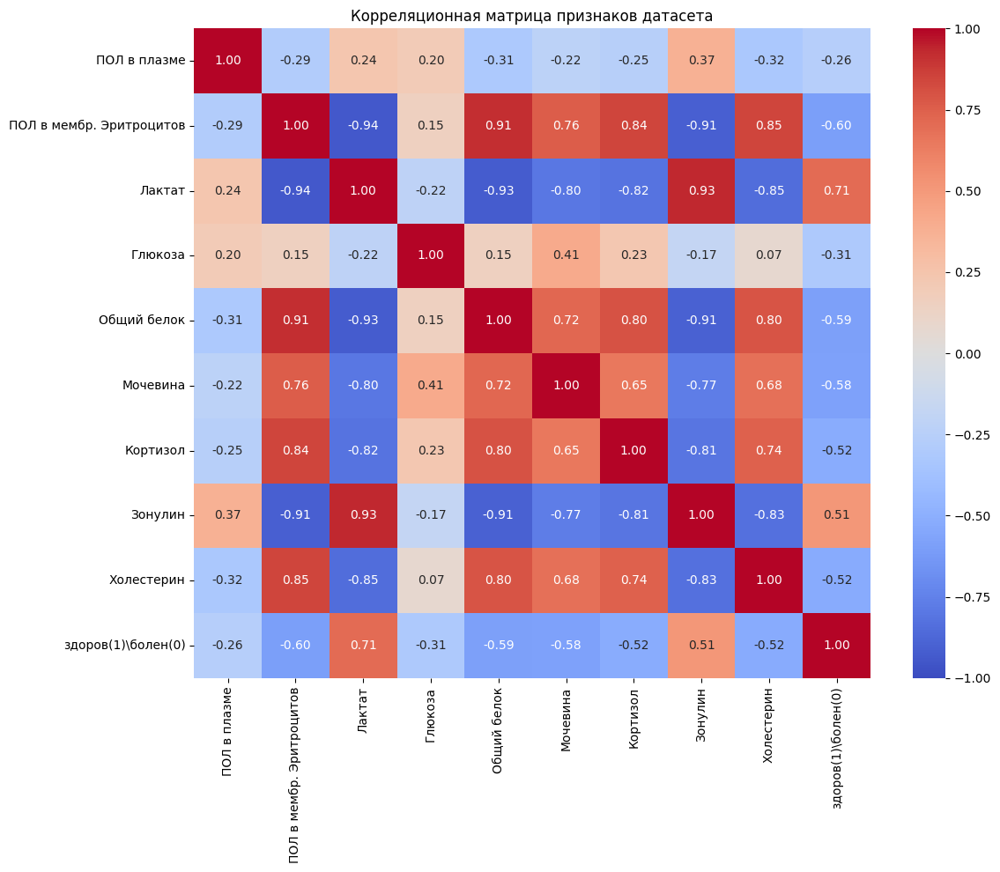

In [8]:
pearson_corr_df_biochemistry = df_biochemistry.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr_df_biochemistry)
plt.figure(figsize=(12, 10))

# Создаем тепловую карту
sns.heatmap(pearson_corr_df_biochemistry, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Корреляционная матрица признаков датасета')
plt.tight_layout()
plt.show()

Корреляция Пирсона:
                          ЭХ        ТГ      НеЖК        ХЛ        ФЛ  \
ЭХ                  1.000000 -0.219211 -0.421289 -0.001002  0.075235   
ТГ                 -0.219211  1.000000 -0.274212 -0.155895 -0.281005   
НеЖК               -0.421289 -0.274212  1.000000 -0.390352 -0.638049   
ХЛ                 -0.001002 -0.155895 -0.390352  1.000000  0.158569   
ФЛ                  0.075235 -0.281005 -0.638049  0.158569  1.000000   
здоров(1)\болен(0) -0.085815 -0.165529  0.207903  0.118101 -0.140787   

                    здоров(1)\болен(0)  
ЭХ                           -0.085815  
ТГ                           -0.165529  
НеЖК                          0.207903  
ХЛ                            0.118101  
ФЛ                           -0.140787  
здоров(1)\болен(0)            1.000000  


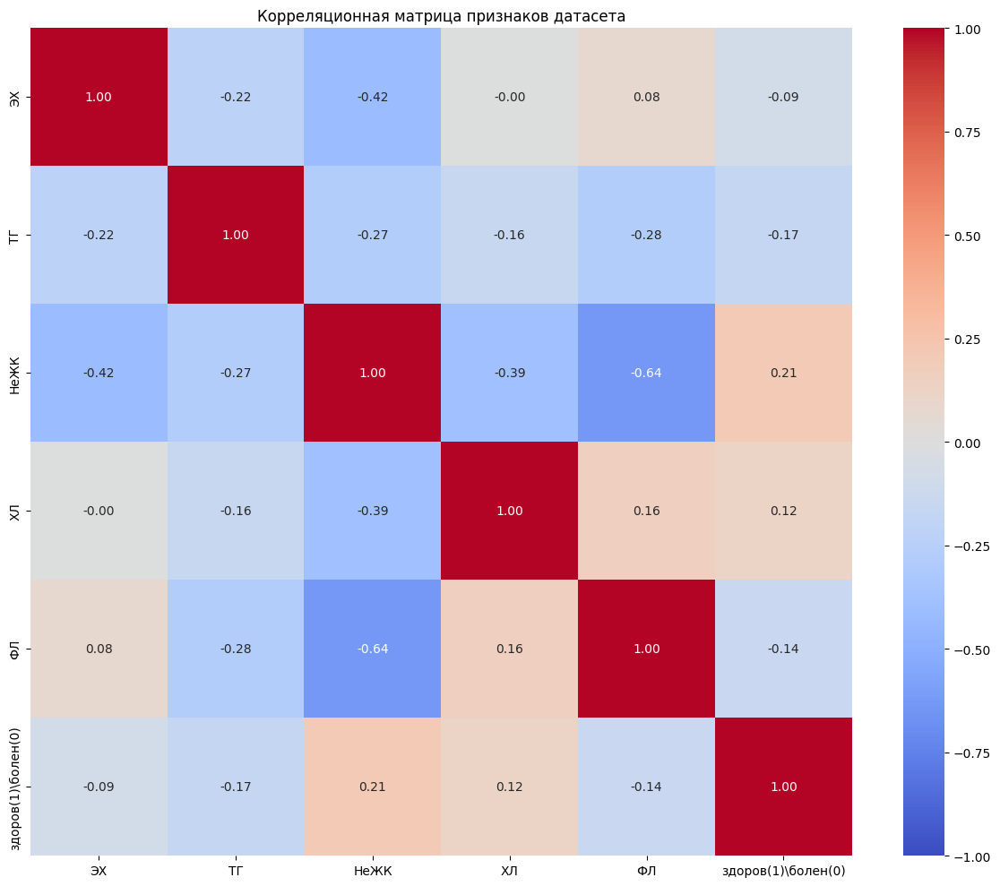

In [9]:
pearson_corr_df_plasma = df_plasma.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr_df_plasma)
plt.figure(figsize=(12, 10))

# Создаем тепловую карту
sns.heatmap(pearson_corr_df_plasma, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Корреляционная матрица признаков датасета')
plt.tight_layout()
plt.show()


Корреляция Пирсона:
                          ФЛ        СХ       СЖК        ТГ        ЭХ  \
ФЛ                  1.000000  0.533483  0.257468 -0.660000 -0.736392   
СХ                  0.533483  1.000000 -0.031533 -0.590062 -0.296616   
СЖК                 0.257468 -0.031533  1.000000 -0.041843 -0.283141   
ТГ                 -0.660000 -0.590062 -0.041843  1.000000  0.306884   
ЭХ                 -0.736392 -0.296616 -0.283141  0.306884  1.000000   
здоров(1)\болен(0) -0.376104 -0.050481  0.015307  0.222777  0.228102   

                    здоров(1)\болен(0)  
ФЛ                           -0.376104  
СХ                           -0.050481  
СЖК                           0.015307  
ТГ                            0.222777  
ЭХ                            0.228102  
здоров(1)\болен(0)            1.000000  


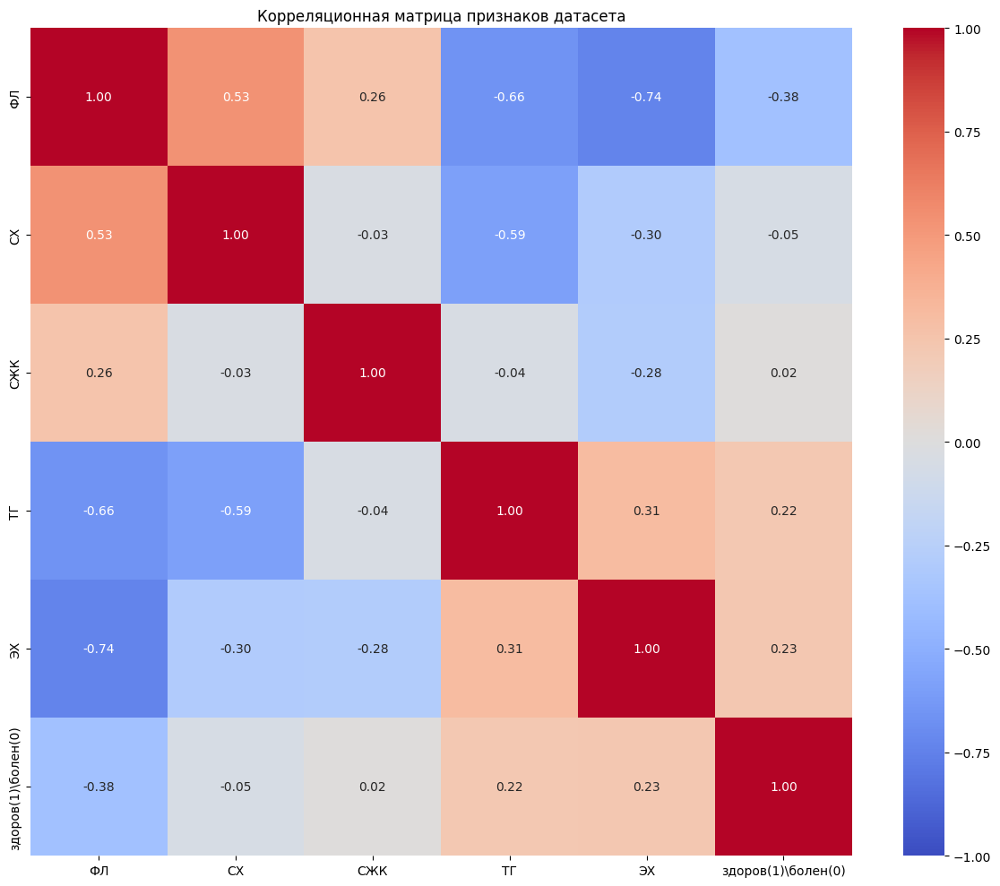

In [10]:
pearson_corr_df_red_blood_cells = df_red_blood_cells.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr_df_red_blood_cells)
plt.figure(figsize=(12, 10))

# Создаем тепловую карту
sns.heatmap(pearson_corr_df_red_blood_cells, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Корреляционная матрица признаков датасета')
plt.tight_layout()
plt.show()

Корреляция Пирсона:
                         ЭХС        ТГ      НЭЖК        СХ        ФЛ  \
ЭХС                 1.000000 -0.214300 -0.423355  0.014577  0.056553   
ТГ                 -0.214300  1.000000 -0.261514 -0.139885 -0.309649   
НЭЖК               -0.423355 -0.261514  1.000000 -0.412779 -0.617866   
СХ                  0.014577 -0.139885 -0.412779  1.000000  0.167650   
ФЛ                  0.056553 -0.309649 -0.617866  0.167650  1.000000   
здоров(1)\болен(0) -0.091899 -0.154018  0.198597  0.119713 -0.137288   

                    здоров(1)\болен(0)  
ЭХС                          -0.091899  
ТГ                           -0.154018  
НЭЖК                          0.198597  
СХ                            0.119713  
ФЛ                           -0.137288  
здоров(1)\болен(0)            1.000000  


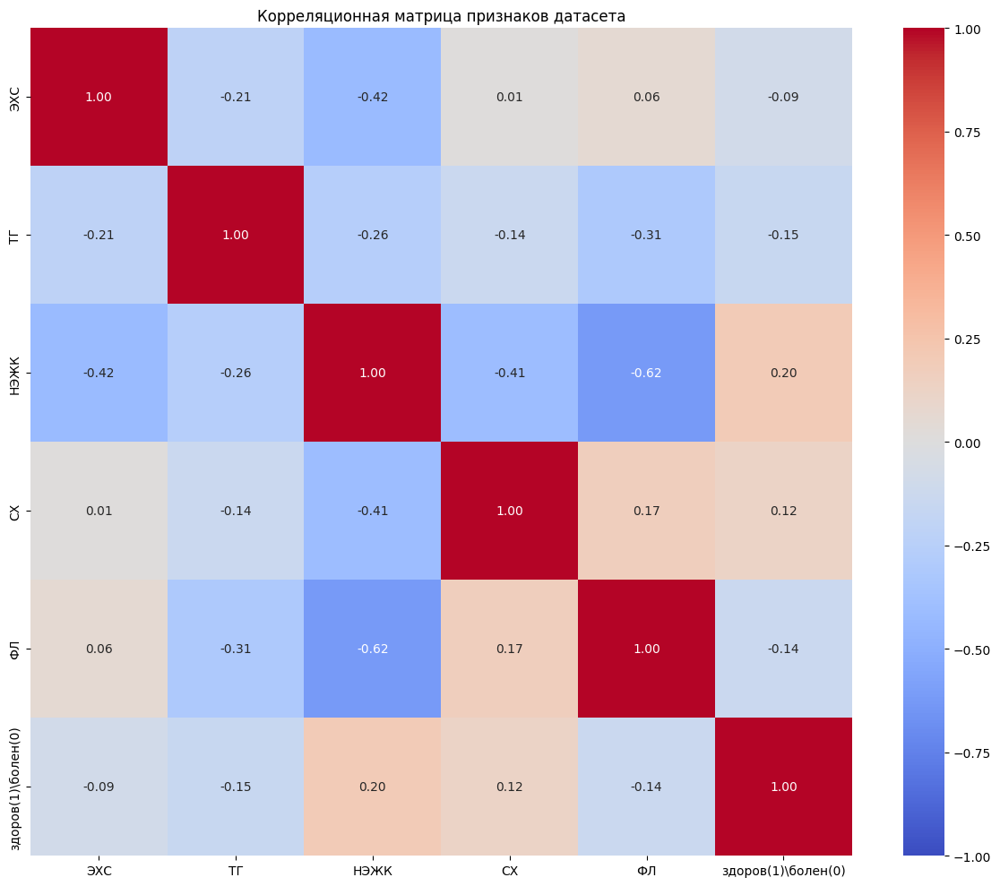

In [11]:
pearson_corr_df_sheet7 = df_sheet7.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr_df_sheet7)
plt.figure(figsize=(12, 10))

# Создаем тепловую карту
sns.heatmap(pearson_corr_df_sheet7, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Корреляционная матрица признаков датасета')
plt.tight_layout()
plt.show()

Корреляция Пирсона:
                       D_1:2     D_1:3     D_1:4     D_1:5     D_1:6  \
D_1:2               1.000000  0.848244  0.121960  0.198568  0.223861   
D_1:3               0.848244  1.000000  0.085963  0.147145  0.379388   
D_1:4               0.121960  0.085963  1.000000  0.432440  0.249191   
D_1:5               0.198568  0.147145  0.432440  1.000000  0.660541   
D_1:6               0.223861  0.379388  0.249191  0.660541  1.000000   
...                      ...       ...       ...       ...       ...   
B2_18:21            0.265471  0.431078  0.069023  0.078218  0.260967   
B2_19:20            0.063137  0.077359  0.091146 -0.051088 -0.047458   
B2_19:21            0.082230  0.185195  0.120746 -0.045963  0.075582   
B2_20:21            0.224972  0.312421  0.052060  0.032388  0.174926   
здоров(1)/болен(0) -0.046573 -0.086138 -0.115222  0.124683  0.012428   

                       D_1:7     D_1:8     D_1:9    D_1:10    D_1:11  ...  \
D_1:2               0.671478  0.548718

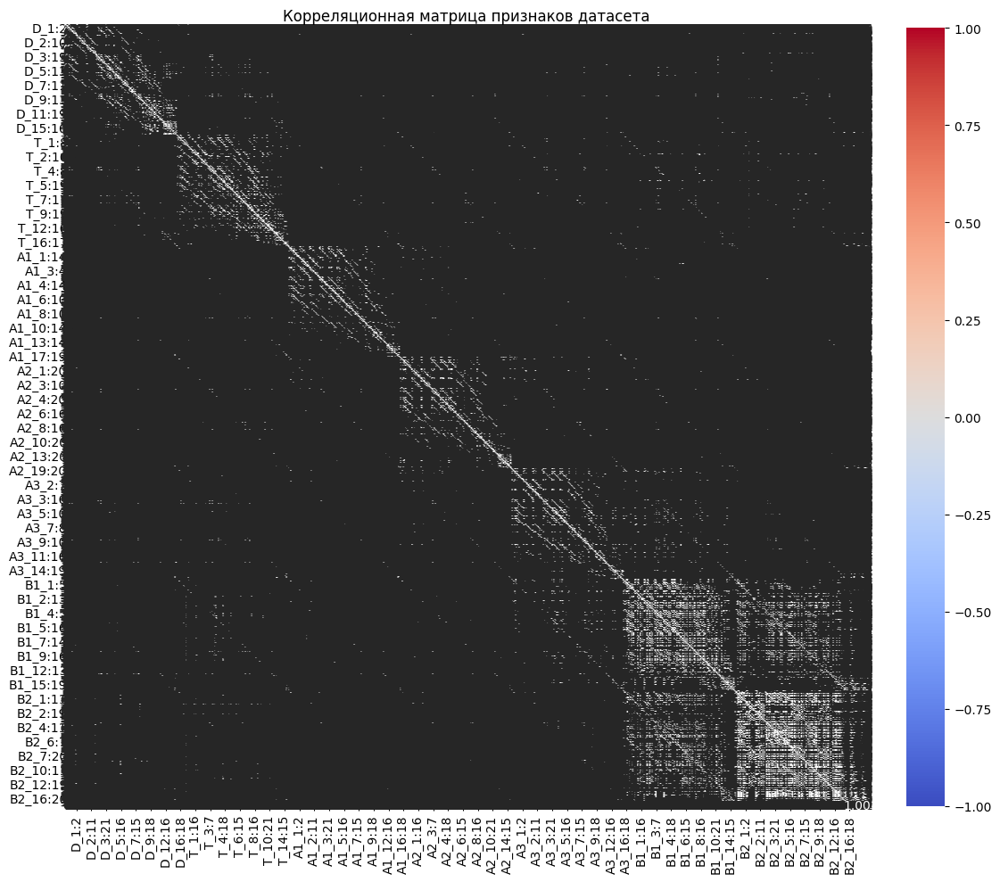

In [5]:
df_train = pd.read_csv(r"C:\Users\a.v.nasirov\Desktop\UDGU_project\EEG_files\df_balanced.csv")
pearson_corr_df_train = df_train.corr(method='pearson')
print("Корреляция Пирсона:")
print(pearson_corr_df_train)
plt.figure(figsize=(12, 10))

# Создаем тепловую карту
sns.heatmap(pearson_corr_df_train, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Корреляционная матрица признаков датасета')
plt.tight_layout()
plt.show()